In [1]:
import sys
import os
current_dir = os.getcwd()
print(current_dir)


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all


In [2]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['..\\..\\..\\..\\UCB-USACE-LSTMs', 'F:\\Dino\\UCB-USACE-LSTMs\\UCB_training\\models\\calpella_all', 'C:\\Users\\Dino\\anaconda3\\python312.zip', 'C:\\Users\\Dino\\anaconda3\\DLLs', 'C:\\Users\\Dino\\anaconda3\\Lib', 'C:\\Users\\Dino\\anaconda3', '', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32\\lib', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\Pythonwin']


In [3]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot

## Set up Working Directory

In [5]:
# Dynamically find the repo root from the current working directory
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

# Construct the target path
target_path = os.path.join(library_path, 'UCB_training', 'models', 'calpella_all')

# Verify if the directory exists before changing
if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("calpella")) #each basin has its own train basin file, so change for different basins e.g "guerneville", etc.
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all
Train Basin File Exists: True


In [6]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("calpella_gage.yaml") #update the yaml file for different basins

## Standard hourly LSTM (no ensembles, no physics), train on training subset, evaluated on validation period

In [8]:
params = {
    "epochs":5,
    "hidden_size": 128,
    "output_dropout": 0.4,
    "seq_length": 90,
}
lstmNoPhysicsHourly = UCB_trainer(path_to_csv, yaml_path= path_to_yaml, hyperparams= params, hourly=True)

In [9]:
lstmNoPhysicsHourly.train()

2025-02-12 13:01:27,538: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130127\output.log initialized.
2025-02-12 13:01:27,539: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130127
2025-02-12 13:01:27,540: ### Run configurations for testing_run
2025-02-12 13:01:27,542: experiment_name: testing_run
2025-02-12 13:01:27,543: train_basin_file: calpella
2025-02-12 13:01:27,546: validation_basin_file: calpella
2025-02-12 13:01:27,549: test_basin_file: calpella
2025-02-12 13:01:27,551: train_start_date: 1994-10-01 00:00:00
2025-02-12 13:01:27,553: train_end_date: 2002-09-30 00:00:00
2025-02-12 13:01:27,555: validation_start_date: 2002-10-01 00:00:00
2025-02-12 13:01:27,557: validation_end_date: 2005-09-30 00:00:00
2025-02-12 13:01:27,559: test_start_date: 2005-10-01 00:00:00
2025-02-12 13:01:27,560: test_end_date: 2009-09-30 00:00:00
2025-02-12 13:01:27,561: device: cpu
2025-02-12 13:01

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:05<00:00,  5.18s/it]
2025-02-12 13:03:44,412: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130127\validation\model_epoch005\validation_metrics.csv
2025-02-12 13:03:44,421: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130127\validation\model_epoch005\validation_results.p


WindowsPath('F:/Dino/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_130127')

got predictions


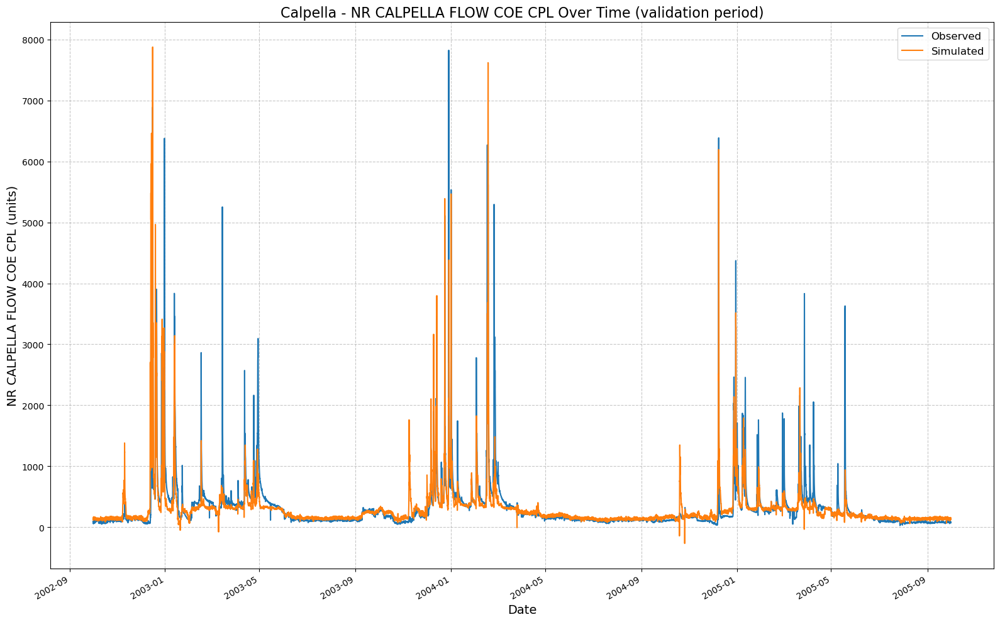

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130127\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [10]:
#outputs simple graph, also logs where the csv where the results are stored (use this csv for when you plot combined graph), also prints the metrics
lstmNoPhysicsHourly_results_path_csv, lstNoPhysicsHourly_results_metrics = lstmNoPhysicsHourly.results() 

## Physics-Informed LSTM (PLSTM) trained on training set, validated on validation set


In [12]:
path_to_physics_data = Path(library_path +"/russian_river_data/Calpella_hourly.csv")
params = {
    "epochs":5,
    "hidden_size": 128,
    "output_dropout": 0.4,
    "seq_length": 90,
}
features_with_physics = [
    #from hourly
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "POTTER VALLEY CA FLOW USGS_ADJUSTED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    #from new capella.csv
    'Capella Gage FLOW',
    'EF Russian 20 ET-POTENTIAL',
    'EF Russian 20 FLOW',
    'EF Russian 20 FLOW-BASE',
    'EF Russian 20 INFILTRATION',
    'EF Russian 20 PERC-SOIL',
    'EF Russian 20 SATURATION FRACTION',
#    'Lake Mendocino Storage',
    ]
lstmPhysicsHourly = UCB_trainer(path_to_csv, yaml_path= path_to_yaml, hyperparams= params, input_features= features_with_physics, physics_informed=True, physics_data_file=path_to_physics_data, hourly=True)

In [13]:
lstmPhysicsHourly.train()

2025-02-12 13:03:45,465: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130345\output.log initialized.
2025-02-12 13:03:45,465: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130345
2025-02-12 13:03:45,477: ### Run configurations for testing_run
2025-02-12 13:03:45,479: experiment_name: testing_run
2025-02-12 13:03:45,481: train_basin_file: calpella
2025-02-12 13:03:45,483: validation_basin_file: calpella
2025-02-12 13:03:45,483: test_basin_file: calpella
2025-02-12 13:03:45,483: train_start_date: 1994-10-01 00:00:00
2025-02-12 13:03:45,483: train_end_date: 2002-09-30 00:00:00
2025-02-12 13:03:45,483: validation_start_date: 2002-10-01 00:00:00
2025-02-12 13:03:45,483: validation_end_date: 2005-09-30 00:00:00
2025-02-12 13:03:45,483: test_start_date: 2005-10-01 00:00:00
2025-02-12 13:03:45,483: test_end_date: 2009-09-30 00:00:00
2025-02-12 13:03:45,493: device: cpu
2025-02-12 13:03

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.69s/it]
2025-02-12 13:06:11,971: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130345\validation\model_epoch005\validation_metrics.csv
2025-02-12 13:06:11,981: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130345\validation\model_epoch005\validation_results.p


WindowsPath('F:/Dino/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_130345')

got predictions


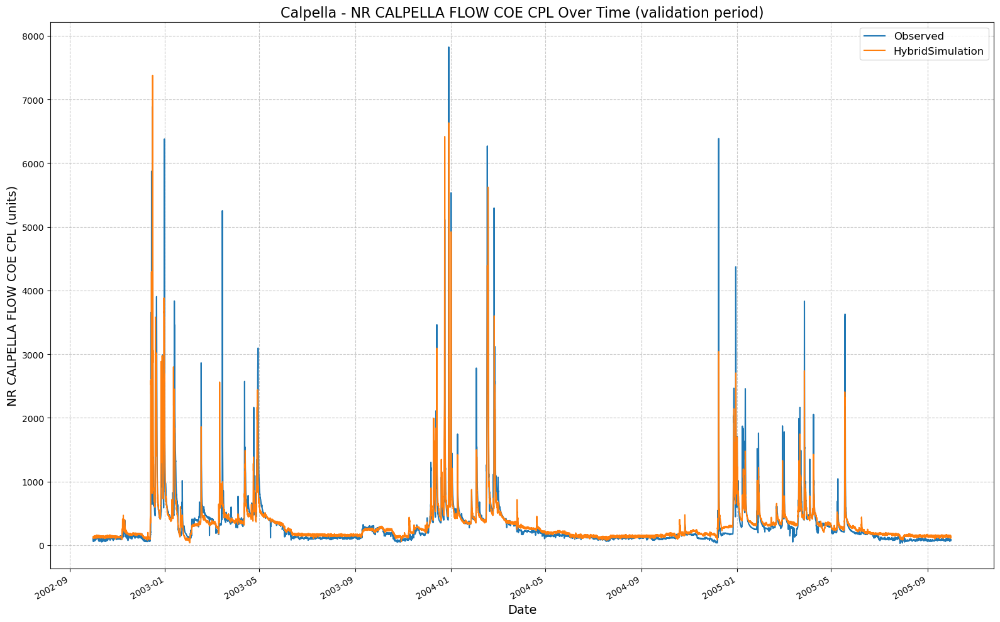

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130345\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [14]:
lstmPhysicsHourly_results_path_csv, lstmPhysicsHourly_results_metrics = lstmPhysicsHourly.results()

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:45: DtypeWarning: Columns (0,3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  hms_df = pd.read_csv(HMS_results) #columns: Date, HMS_predicted
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is depre

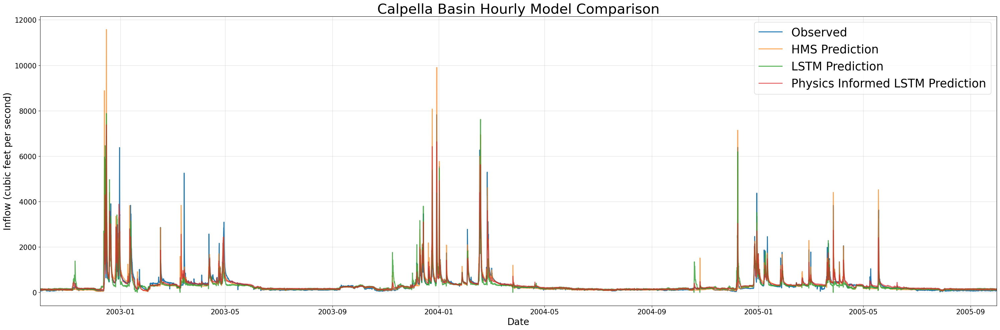

In [15]:
lstm_results_path = lstmNoPhysicsHourly_results_path_csv
lstmPhysics_results_path = lstmPhysicsHourly_results_path_csv
myplot, metrics_df = combinedPlot(lstm_results=lstm_results_path, lstmPhysics_results= lstmPhysics_results_path, HMS_results=path_to_physics_data, title='Calpella Basin Hourly Model Comparison', fName = "calpella_hourly_eval_metrics.csv")

In [16]:
metrics_df

,HMS,LSTM,Physics_Informed_LSTM
NSE,0.629094,0.636765,0.758300
MSE,81016.005413,79340.475950,52793.916453
RMSE,284.633107,281.674415,229.769268
KGE,0.735685,0.766758,0.811945
Alpha-NSE,1.225445,0.880171,0.877219
Beta-KGE,1.045636,0.970790,1.062164
Beta-NSE,0.030922,-0.019792,0.042121
Pearson-r,0.869792,0.802036,0.871839
FHV,17.058090,-11.337819,-10.024367
FMS,-9.898612,-37.141410,-24.732225


## If you prefer the interactive plotly graph , you can use 'fancyCombinedPlot' (must have plotly library downloaded)

In [18]:
path_to_physics_data = Path(library_path +"/russian_river_data/Calpella_hourly.csv")

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:116: DtypeWarning: Columns (0,3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  hms_df = pd.read_csv(HMS_results)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in 

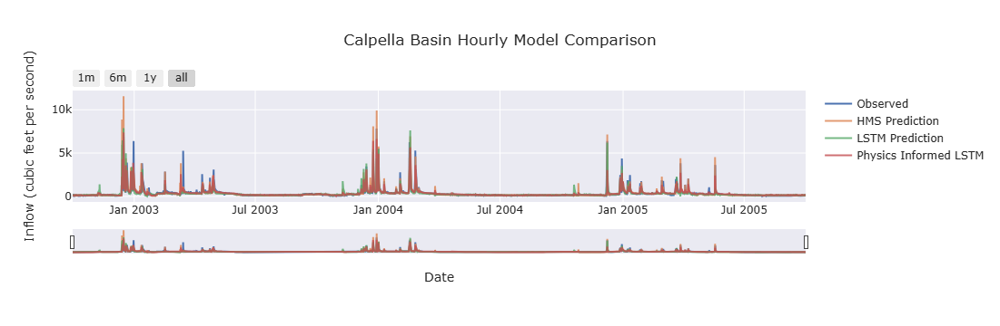

,HMS,LSTM,Physics_Informed_LSTM
NSE,0.629094,0.636765,0.758300
MSE,81016.005413,79340.475950,52793.916453
RMSE,284.633107,281.674415,229.769268
KGE,0.735685,0.766758,0.811945
Alpha-NSE,1.225445,0.880171,0.877219
Beta-KGE,1.045636,0.970790,1.062164
Beta-NSE,0.030922,-0.019792,0.042121
Pearson-r,0.869792,0.802036,0.871839
FHV,17.058090,-11.337819,-10.024367
FMS,-9.898612,-37.141410,-24.732225


In [19]:
fancyCombinedPlot(lstm_results=lstm_results_path, lstmPhysics_results= lstmPhysics_results_path, HMS_results=path_to_physics_data, title='Calpella Basin Hourly Model Comparison', fName = "calpella_hourly_eval_metrics.csv")

## Re-train standard hourly LSTM (no ensembles, no physics) on entire dataset, evaluate on test period

In [21]:
params = {
    "epochs":16,
    "hidden_size": 128,
    "output_dropout": 0.4,
    "seq_length": 90,
}
lstmNoPhysicsHourlyExt = UCB_trainer(path_to_csv, yaml_path= path_to_yaml, hyperparams= params, hourly=True, extend_train_period=True)

In [22]:
lstmNoPhysicsHourlyExt.train()

2025-02-12 13:06:21,112: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130621\output.log initialized.
2025-02-12 13:06:21,114: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130621
2025-02-12 13:06:21,114: ### Run configurations for testing_run
2025-02-12 13:06:21,114: experiment_name: testing_run
2025-02-12 13:06:21,134: train_basin_file: calpella
2025-02-12 13:06:21,134: validation_basin_file: calpella
2025-02-12 13:06:21,134: test_basin_file: calpella
2025-02-12 13:06:21,143: train_start_date: 1994-10-01 00:00:00
2025-02-12 13:06:21,145: train_end_date: 2005-09-30 00:00:00
2025-02-12 13:06:21,145: validation_start_date: 2002-10-01 00:00:00
2025-02-12 13:06:21,145: validation_end_date: 2005-09-30 00:00:00
2025-02-12 13:06:21,155: test_start_date: 2005-10-01 00:00:00
2025-02-12 13:06:21,155: test_end_date: 2009-09-30 00:00:00
2025-02-12 13:06:21,155: device: cpu
2025-02-12 13:06

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:05<00:00,  5.69s/it]
2025-02-12 13:16:30,858: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130621\validation\model_epoch016\validation_metrics.csv
2025-02-12 13:16:30,868: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130621\validation\model_epoch016\validation_results.p


WindowsPath('F:/Dino/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_130621')

got predictions


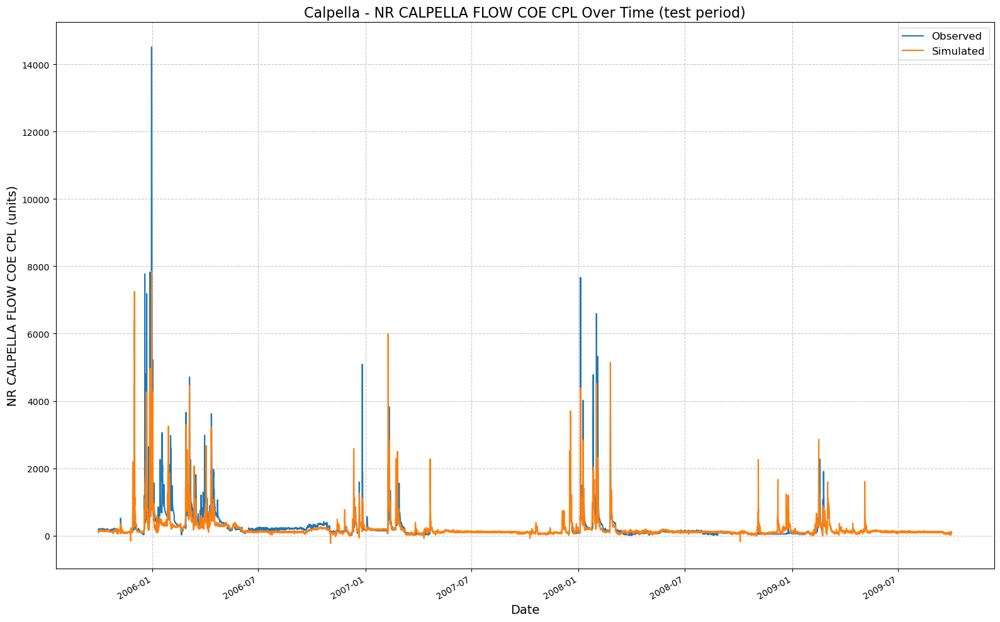

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_130621\results_output_test.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [40]:
lstmNoPhysicsHourlyExt_results_path_csv, lstmNoPhysicsHourlyExt_results_metrics = lstmNoPhysicsHourlyExt.results('test')

## Re-train physics hourly LSTM (no ensembles, no physics) on entire dataset, evaluate on test period

In [25]:
path_to_physics_data = Path(library_path +"/russian_river_data/Calpella_hourly.csv")
params = {
    "epochs":16,
    "hidden_size": 128,
    "output_dropout": 0.4,
    "seq_length": 90,
}
features_with_physics = [
    #from hourly
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "POTTER VALLEY CA FLOW USGS_ADJUSTED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    #from new capella.csv
    'Capella Gage FLOW',
    'EF Russian 20 ET-POTENTIAL',
    'EF Russian 20 FLOW',
    'EF Russian 20 FLOW-BASE',
    'EF Russian 20 INFILTRATION',
    'EF Russian 20 PERC-SOIL',
    'EF Russian 20 SATURATION FRACTION',
#    'Lake Mendocino Storage',
    ]
lstmPhysicsHourlyExt = UCB_trainer(path_to_csv, yaml_path= path_to_yaml, hyperparams= params, input_features= features_with_physics, physics_informed=True, physics_data_file=path_to_physics_data, hourly=True, extend_train_period=True)

In [26]:
lstmPhysicsHourlyExt.train()

2025-02-12 13:16:39,254: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_131639\output.log initialized.
2025-02-12 13:16:39,256: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_131639
2025-02-12 13:16:39,257: ### Run configurations for testing_run
2025-02-12 13:16:39,259: experiment_name: testing_run
2025-02-12 13:16:39,260: train_basin_file: calpella
2025-02-12 13:16:39,261: validation_basin_file: calpella
2025-02-12 13:16:39,263: test_basin_file: calpella
2025-02-12 13:16:39,265: train_start_date: 1994-10-01 00:00:00
2025-02-12 13:16:39,266: train_end_date: 2005-09-30 00:00:00
2025-02-12 13:16:39,267: validation_start_date: 2002-10-01 00:00:00
2025-02-12 13:16:39,269: validation_end_date: 2005-09-30 00:00:00
2025-02-12 13:16:39,270: test_start_date: 2005-10-01 00:00:00
2025-02-12 13:16:39,271: test_end_date: 2009-09-30 00:00:00
2025-02-12 13:16:39,272: device: cpu
2025-02-12 13:16

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.71s/it]
2025-02-12 13:27:59,009: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_131639\validation\model_epoch016\validation_metrics.csv
2025-02-12 13:27:59,017: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_131639\validation\model_epoch016\validation_results.p


WindowsPath('F:/Dino/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_131639')

got predictions


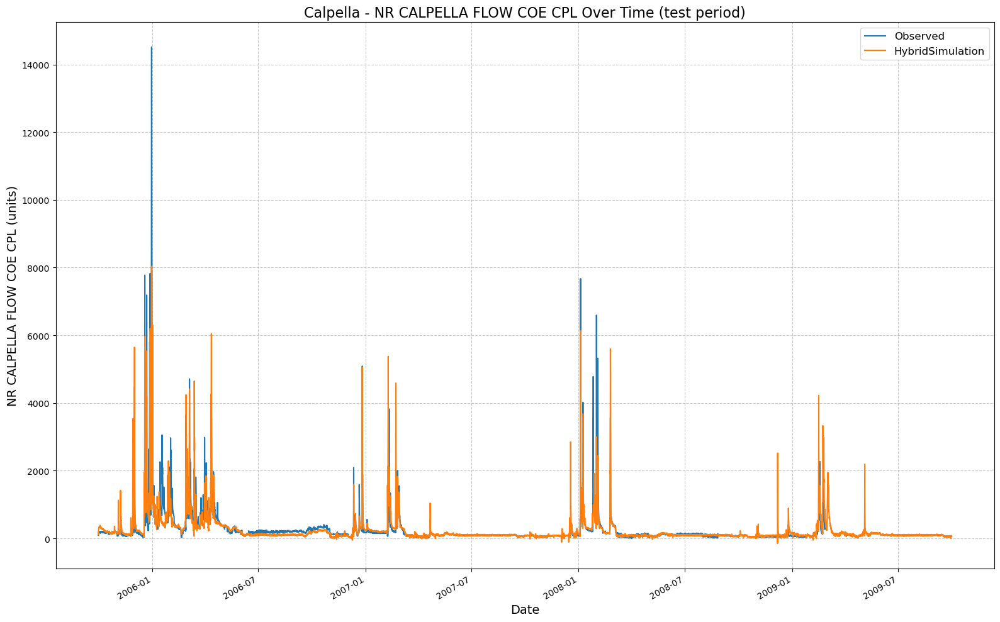

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_131639\results_output_test.csv


In [42]:
lstmPhysicsHourlyExt_results_path_csv, lstmPhysicsHourlyExt_results_metrics = lstmPhysicsHourlyExt.results('test')

## compare results

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:45: DtypeWarning:

Columns (0,3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\ne

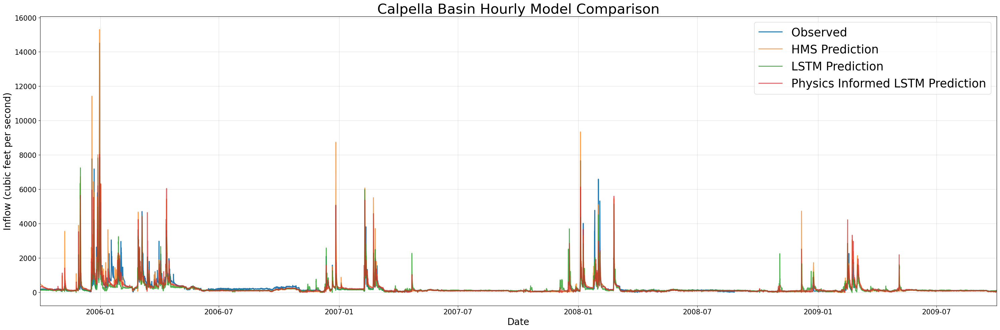

In [44]:
lstm_results_path_ext = lstmNoPhysicsHourlyExt_results_path_csv
lstmPhysics_results_path_ext = lstmPhysicsHourlyExt_results_path_csv
myplot, metrics_df = combinedPlot(lstm_results=lstm_results_path_ext, lstmPhysics_results= lstmPhysics_results_path_ext, HMS_results=path_to_physics_data, title='Calpella Basin Hourly Model Comparison', fName = "calpella_hourly_metrics.csv")

In [46]:
metrics_df

,HMS,LSTM,Physics_Informed_LSTM
NSE,0.678386,0.645797,0.719240
MSE,115292.922339,126975.639890,100647.619107
RMSE,339.548115,356.336414,317.250089
KGE,0.761798,0.641642,0.810080
Alpha-NSE,1.198263,0.741310,0.886079
Beta-KGE,1.060366,0.840043,0.983553
Beta-NSE,0.029987,-0.079459,-0.008170
Pearson-r,0.882577,0.810492,0.848933
FHV,22.973901,-19.879482,-4.740351
FMS,0.436480,-25.047367,-5.467533


In [ ]:
fancyCombinedPlot(lstm_results=lstm_results_path_ext, lstmPhysics_results= lstmPhysics_results_path_ext, HMS_results=path_to_physics_data, title='Calpella Basin Model Comparison', fName = "calpella_metrics.csv")

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:116: DtypeWarning:

Columns (0,3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\n